In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [48]:
train_transaction = pd.read_csv('ieee-fraud-detection/train_transaction.csv')
train_identity = pd.read_csv('ieee-fraud-detection/train_identity.csv')
test_transaction = pd.read_csv('ieee-fraud-detection/test_transaction.csv')
test_identity = pd.read_csv('ieee-fraud-detection/test_identity.csv')

In [26]:
list(train_transaction.columns)

['TransactionID',
 'isFraud',
 'TransactionDT',
 'TransactionAmt',
 'ProductCD',
 'card1',
 'card2',
 'card3',
 'card4',
 'card5',
 'card6',
 'addr1',
 'addr2',
 'dist1',
 'dist2',
 'P_emaildomain',
 'R_emaildomain',
 'C1',
 'C2',
 'C3',
 'C4',
 'C5',
 'C6',
 'C7',
 'C8',
 'C9',
 'C10',
 'C11',
 'C12',
 'C13',
 'C14',
 'D1',
 'D2',
 'D3',
 'D4',
 'D5',
 'D6',
 'D7',
 'D8',
 'D9',
 'D10',
 'D11',
 'D12',
 'D13',
 'D14',
 'D15',
 'M1',
 'M2',
 'M3',
 'M4',
 'M5',
 'M6',
 'M7',
 'M8',
 'M9',
 'V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'V29',
 'V30',
 'V31',
 'V32',
 'V33',
 'V34',
 'V35',
 'V36',
 'V37',
 'V38',
 'V39',
 'V40',
 'V41',
 'V42',
 'V43',
 'V44',
 'V45',
 'V46',
 'V47',
 'V48',
 'V49',
 'V50',
 'V51',
 'V52',
 'V53',
 'V54',
 'V55',
 'V56',
 'V57',
 'V58',
 'V59',
 'V60',
 'V61',
 'V62',
 'V63',
 'V64',
 'V

In [53]:
user_id = train_transaction[['TransactionID','card1','card2','card3','card4','card5','card6','P_emaildomain']].groupby(['card1','card2','card3','card4','card5','card6','P_emaildomain']).count().sort_values(by='TransactionID', ascending=False).reset_index().reset_index().rename(columns={'index':'UserID'})
user_id.drop('TransactionID',axis = 1, inplace=True)

In [54]:
user_id

,UserID,card1,card2,card3,card4,card5,card6,P_emaildomain
0,0,9500,321.0,150.0,visa,226.0,debit,gmail.com
1,1,7919,194.0,150.0,mastercard,166.0,debit,gmail.com
2,2,15885,545.0,185.0,visa,138.0,debit,hotmail.com
3,3,17188,321.0,150.0,visa,226.0,debit,gmail.com
4,4,15885,545.0,185.0,visa,138.0,debit,gmail.com
...,...,...,...,...,...,...,...,...
38318,38318,9280,517.0,150.0,mastercard,224.0,debit,yahoo.com
38319,38319,9280,517.0,150.0,mastercard,224.0,debit,hotmail.com
38320,38320,9277,206.0,150.0,mastercard,229.0,debit,yahoo.com
38321,38321,9277,206.0,150.0,mastercard,229.0,debit,q.com


In [55]:
train_transaction = pd.merge(train_transaction, user_id, how="inner", on=['card1','card2','card3','card4','card5','card6','P_emaildomain'])

In [57]:
product_id = train_transaction[['TransactionID','addr1','addr2','ProductCD', 'R_emaildomain']].groupby(['addr1','addr2','ProductCD', 'R_emaildomain']).count().sort_values(by='TransactionID', ascending=False).reset_index()

In [58]:
product_id['ProductID'] = np.array([i+len(user_id) for i in range(len(product_id))])
product_id.drop('TransactionID',axis = 1, inplace=True)

In [59]:
product_id

,addr1,addr2,ProductCD,R_emaildomain,ProductID
0,299.0,87.0,R,gmail.com,38323
1,299.0,87.0,H,gmail.com,38324
2,299.0,87.0,R,anonymous.com,38325
3,325.0,87.0,H,gmail.com,38326
4,204.0,87.0,R,gmail.com,38327
...,...,...,...,...,...
2312,433.0,87.0,R,live.com,40635
2313,433.0,87.0,R,mac.com,40636
2314,299.0,87.0,R,cfl.rr.com,40637
2315,433.0,87.0,R,msn.com,40638


In [60]:
train_transaction = pd.merge(train_transaction, product_id, how="inner", on=['addr1','addr2','ProductCD', 'R_emaildomain'])

In [69]:
train_transaction

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V332,V333,V334,V335,V336,V337,V338,V339,UserID,ProductID
0,2990906,1,160261,150.0,R,2755,404.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,488,38327
1,2990909,1,160298,150.0,R,2755,404.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,488,38327
2,3348703,0,8972070,75.0,R,18132,567.0,150.0,mastercard,117.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,51,38327
3,3093880,0,2130818,100.0,R,11401,543.0,150.0,mastercard,117.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1983,38327
4,3026696,0,962295,500.0,R,1724,583.0,150.0,visa,226.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117,38327
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62290,3556489,0,15107691,40.0,H,17262,578.0,150.0,mastercard,166.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,23692,40037
62291,3563234,0,15304170,150.0,H,13925,555.0,219.0,mastercard,224.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18616,39848
62292,3563235,0,15304233,150.0,H,13925,555.0,219.0,mastercard,224.0,...,150.0,150.0,0.0,0.0,0.0,0.0,0.0,0.0,18616,39848
62293,3564357,0,15360596,75.0,H,15066,170.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,26960,40590


In [75]:
train_graph = train_transaction[['UserID','ProductID','isFraud','D1','D2','D3','D4','D5','D6','D7','D8','D9','D10','D11','D12','D13','D14','D15','M1','M2','M3','M4','M5','M6','M7','M8','M9','TransactionAmt','TransactionDT']]
G_train = nx.from_pandas_edgelist(train_graph, source='UserID',target='ProductID', edge_attr=True)


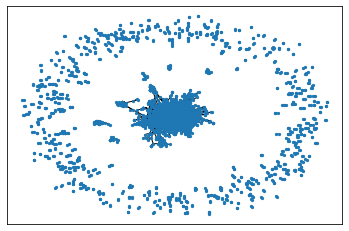

In [78]:
nx.drawing.nx_pylab.draw_networkx(G_train, node_size=5, edge_color='black', with_labels=False)

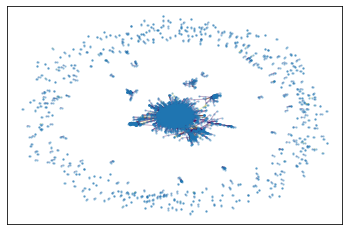

In [93]:
nx.draw_networkx(G_train, edge_color=[G_train.edges[i]['isFraud'] for i in G_train.edges()], node_size=2, with_labels=False,alpha=0.3)

In [6]:
train_identity

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,...,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,...,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144228,3577521,-15.0,145955.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 66.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,F3111 Build/33.3.A.1.97
144229,3577526,-5.0,172059.0,NaN,NaN,1.0,-5.0,NaN,NaN,NaN,...,chrome 55.0 for android,32.0,855x480,match_status:2,T,F,T,F,mobile,A574BL Build/NMF26F
144230,3577529,-20.0,632381.0,NaN,NaN,-1.0,-36.0,NaN,NaN,NaN,...,chrome 65.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,Moto E (4) Plus Build/NMA26.42-152
144231,3577531,-5.0,55528.0,0.0,0.0,0.0,-7.0,NaN,NaN,0.0,...,chrome 66.0,24.0,2560x1600,match_status:2,T,F,T,F,desktop,MacOS


In [80]:
import dgl

dgl.from_networkx(G_train)

DGL backend not selected or invalid.  Assuming PyTorch for now.
Setting the default backend to "pytorch". You can change it in the ~/.dgl/config.json file or export the DGLBACKEND environment variable.  Valid options are: pytorch, mxnet, tensorflow (all lowercase)
Using backend: pytorch


Graph(num_nodes=16496, num_edges=74568,
      ndata_schemes={}
      edata_schemes={})

In [ ]:
import dgl.function as fn